# Using Super Resolution Convolutional Neural Network (SRCNN) for Image Restoration

Paper: https://arxiv.org/abs/1501.00092
<br>
Implementation adapted from: https://github.com/kunal-visoulia/Image-Restoration-using-SRCNN

In [ ]:
#!/usr/bin/env python
# -*-coding:utf-8 -*-
"""
  ████
██    ██   Datature
  ██  ██   Powering Breakthrough AI
    ██
 
@File    :   image_restoration_srcnn.py
@Author  :   Wei Loon Cheng
@Version :   1.0
@Contact :   hello@datature.io
@License :   Apache License 2.0
@Desc    :   Using SRCNN for Image Restoration.
"""

## Install Prerequisites

In [1]:
%pip install keras
%pip install matplotlib
%pip install numpy
%pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os

import cv2
import numpy
import numpy as np
from keras.layers import Conv2D
from keras.models import Sequential
from keras.optimizers import Adam
from matplotlib import pyplot as plt

2023-09-15 15:13:36.607320: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-15 15:13:36.810645: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-15 15:13:36.838312: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/cwlroda/.local/lib/python3.7/site-packages/cv2/../../lib64:/usr/local/cuda/lib64:/usr/lo

## Building the SRCNN Architecture
In Keras, it's as simple as adding layers one after the other. The architecture and hyper parameters of the SRCNN network can be obtained from the publication referenced above.

In [3]:
# Define the SRCNN model
def model():
    SRCNN = Sequential()
    SRCNN.add(
        Conv2D(filters=128,
               kernel_size=(9, 9),
               kernel_initializer='glorot_uniform',
               activation='relu',
               padding='valid',
               use_bias=True,
               input_shape=(None, None, 1)))
    SRCNN.add(
        Conv2D(filters=64,
               kernel_size=(3, 3),
               kernel_initializer='glorot_uniform',
               activation='relu',
               padding='same',
               use_bias=True))
    SRCNN.add(
        Conv2D(filters=1,
               kernel_size=(5, 5),
               kernel_initializer='glorot_uniform',
               activation='linear',
               padding='valid',
               use_bias=True))

    # Define optimizer
    adam = Adam(lr=3e-4)

    # Compile model
    SRCNN.compile(optimizer=adam,
                  loss='mean_squared_error',
                  metrics=['mean_squared_error'])

    return SRCNN

## SRCNN Prediction
Now that we have defined our model, we can use it for single-image super-resolution. The images are preprocessed before using them as inputs to the network. This processing will include cropping and color space conversions.

Additionally, to save us the time it takes to train a deep neural network, we will be loading pre-trained weights for the SRCNN. These weights can be found at the following GitHub page: https://github.com/MarkPrecursor/SRCNN-keras.

In [4]:
# When we run images through SRCNN based on the kernel sizes and convolutional layers,
# we are going to lose some of these outside pixels.
# The images are going to get smaller and that's why it's necessary to have a divisible image size
def modcrop(img, scale):
    tmpsz = img.shape
    sz = tmpsz[0:2]

    # Ensures that dimension of our image are divisible by scale by cropping the images size
    # np.mod returns the remainder between our size and scale
    sz = sz - np.mod(sz, scale)
    img = img[0:sz[0], 1:sz[1]]
    return img


# Crop border from all sides of the image
def shave(image, border):
    img = image[border:-border, border:-border]
    return img

In [5]:
def predict(image_path):
    # Load the SRCNN model and weights
    srcnn = model()
    srcnn.load_weights('model/3051crop_weight_200.h5')

    # Load and preprocess the degraded image
    degraded = cv2.imread(image_path)
    degraded = modcrop(degraded, 3)

    # Convert the image to YCrCb (3 channel image) - SRCNN trained on Y channel
    temp = cv2.cvtColor(degraded, cv2.COLOR_BGR2YCrCb)

    # Create image slice and normalize
    # SRCNN works on one dimensional input (or 3D inputs of depth 1, i.e. inputs with one channel)
    Y = numpy.zeros((1, temp.shape[0], temp.shape[1], 1), dtype=float)
    Y[0, :, :, 0] = temp[:, :, 0].astype(float) / 255 # normalize

    # Perform super-resolution with SRCNN
    pre = srcnn.predict(Y, batch_size=1)

    # Postprocess output
    pre *= 255  # unnormalize
    pre[pre[:] >
        255] = 255  # if any pixel value is greater than 255, we set it to 255
    pre[pre[:] < 0] = 0  # if any pixel value is less than 0, we set it to 0
    pre = pre.astype(np.uint8)  # convert from float back to int

    temp = shave(temp, 6)
    temp[:, :, 0] = pre[0, :, :, 0]
    output = cv2.cvtColor(temp, cv2.COLOR_YCrCb2BGR)

    # Remove border from degraded image so that all images are of the same size
    degraded = shave(degraded.astype(np.uint8), 6)

    # Return images
    return degraded, output

2023-09-15 15:13:38.681756: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/cwlroda/.local/lib/python3.7/site-packages/cv2/../../lib64:/usr/local/cuda/lib64:/usr/local/cuda/extras/CUPTI/lib64:
2023-09-15 15:13:38.682084: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-09-15 15:13:38.682112: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (cwlroda-XPS-9320): /proc/driver/nvidia/version does not exist
2023-09-15 15:13:38.682637: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable

1/1 [==============================] - 0s 195ms/step


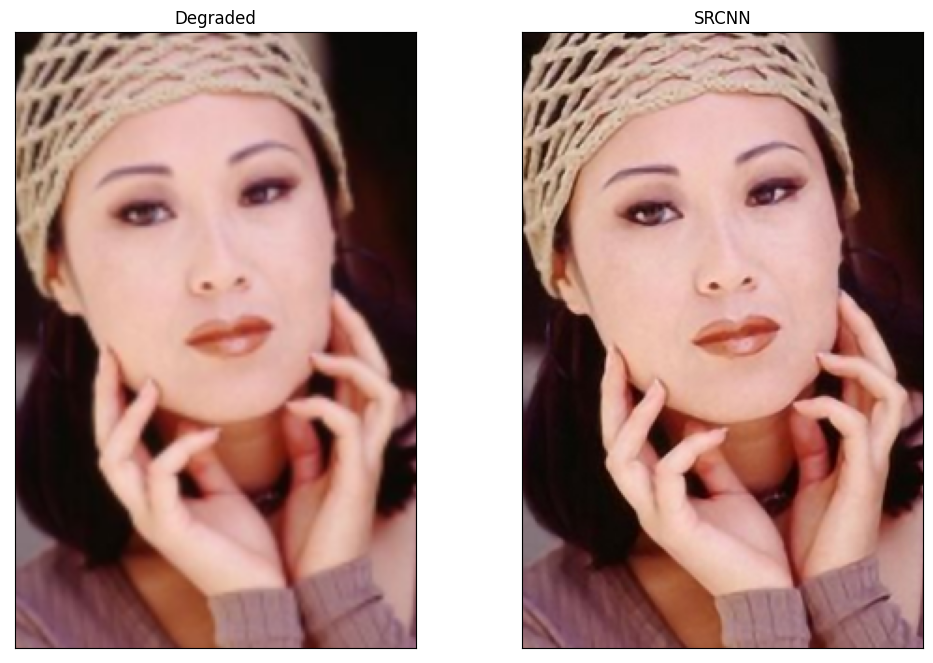

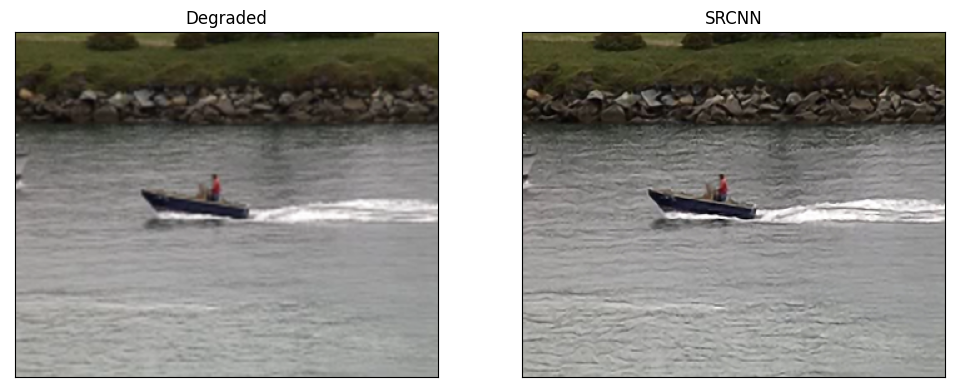

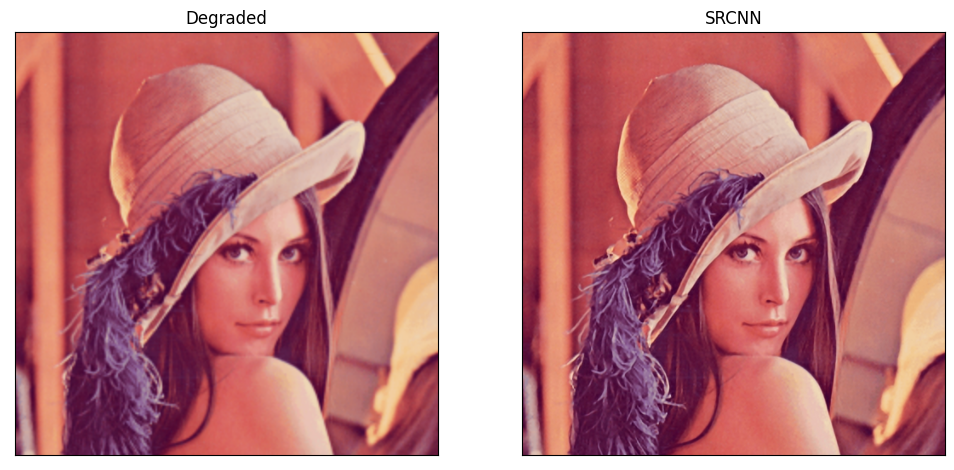

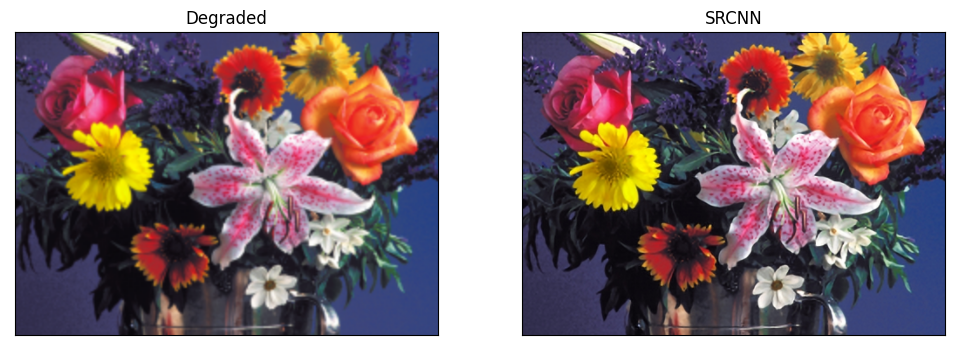

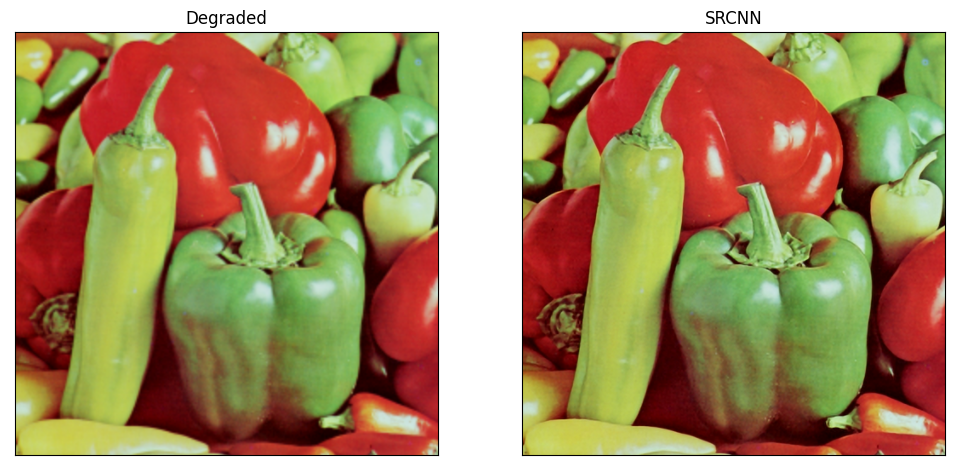

...

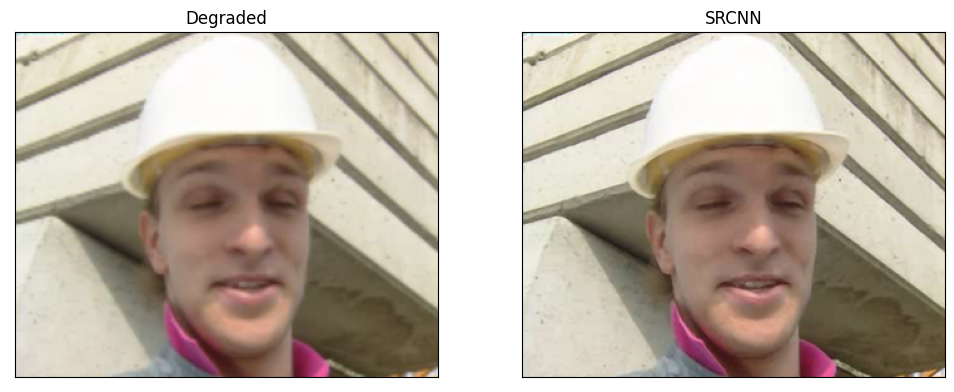

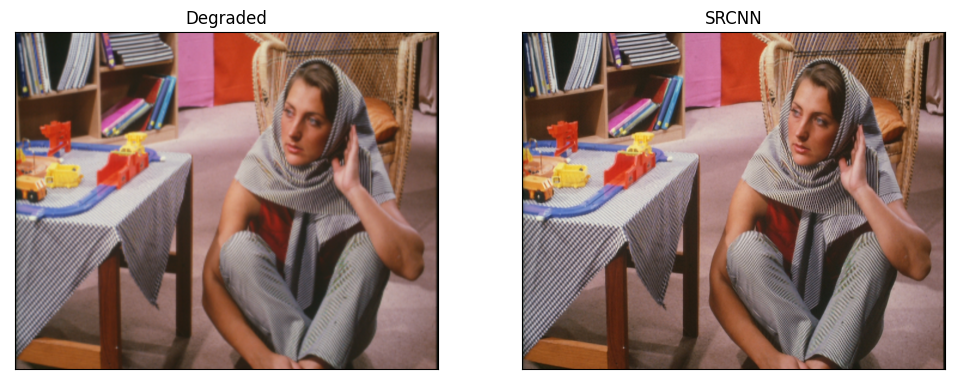

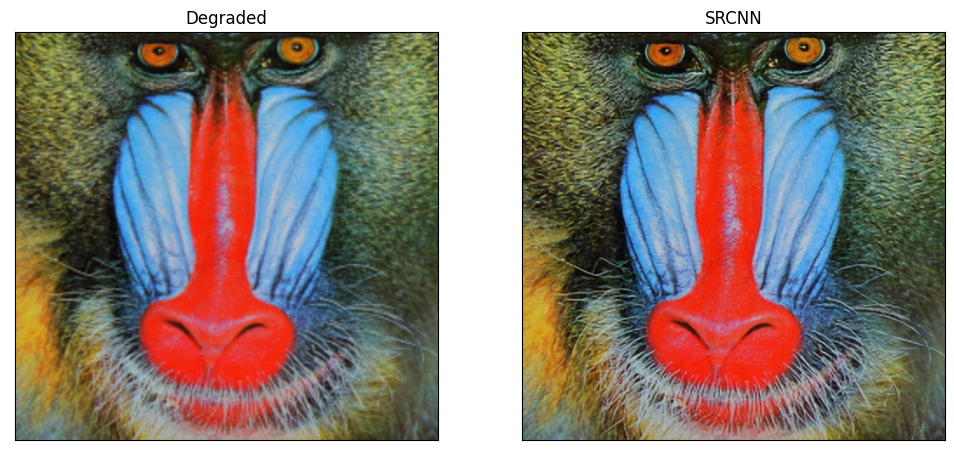

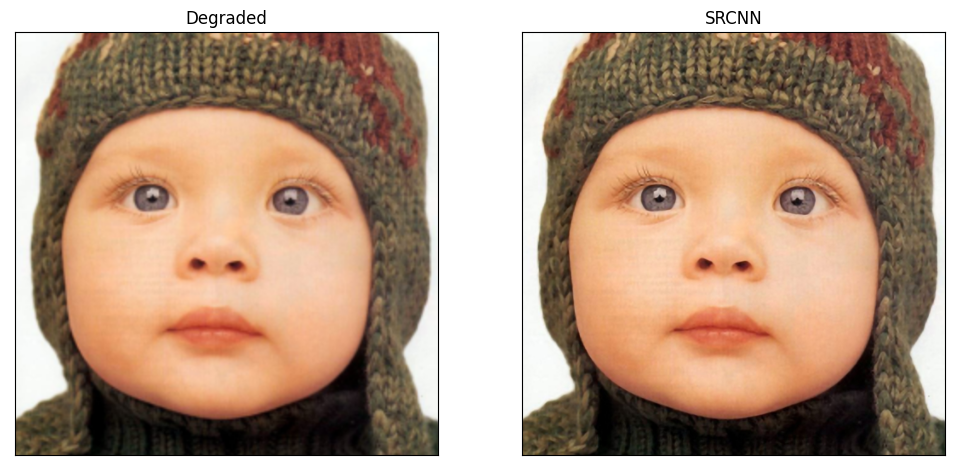

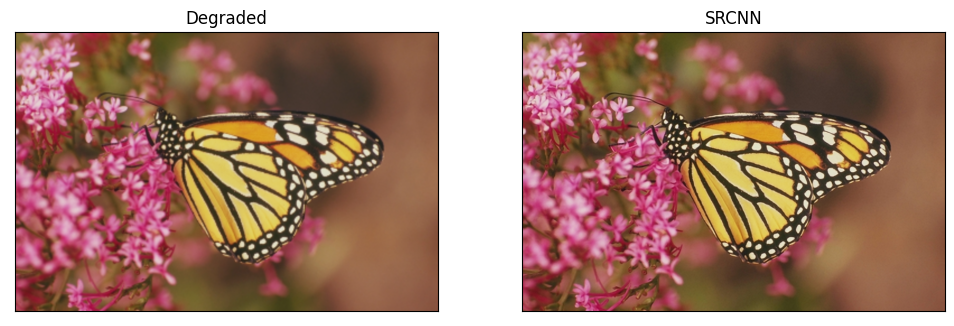

In [6]:
input_dir = 'images/' # change this to your input directory
for file in os.listdir(input_dir):
    # Perform super-resolution
    degraded, output = predict(os.path.join(input_dir, file))
    
    # Display images as subplots
    fig, axs = plt.subplots(1, 2, figsize=(12, 8))
    axs[0].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Degraded')
    axs[1].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axs[1].set_title('SRCNN')

    # Remove the x and y ticks
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])